# **APS 1 - IA para Automação**
## **Classificador de Falhas em Acionamento de Máquinas Rotativas**
### _Trabalho feito por Bruno Olivares, Gustavo e Lucas Gomes_

#### **1. Panorama do Projeto**

#### **2. Exploração dos Dados**

Como mencionado, para a elaboração do classificador em questão, nos foi fornecido um dataset com diversos dados coletados referente a todas as categorias abordadas pelo problema. Antes de realmente elaborar os algoritmos, é necessário entender com que dados que se está trabalhando e que informações que são possíveis de extrair delas antes de reaizar qualquer progresso, e é essa etapa que será abordada nesse tópico. 

Antes de realizar quaisquer operações, primeiro é necessário importar algumas bibliotecas que serão utilizadas não só nessa etapa, mas durante toda a elaboração do projeto:

In [12]:
# Bibliotecas utilizadas no decorrer do projeto

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Atualmente, o dataset está na forma de csv (Comma Separated Values). De forma que possamos processar as informações de forma adequada via Python, primeiro será transformada o arquivo .csv em um dataframe que pode então ser melhor e visualizado:

In [13]:
# Leitura e Exibição do Dataset

df_maquinas = pd.read_csv("Dataset APS1_Sinais Eletricos e Vibracao_csv.xls")
df_maquinas

,tempo_s,tipo_setup,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
0,0.00,0.0,0.44905,63.67320,1.43660,0.042740,21.869566,0.113479,0.175,91.738,0.406,12.474475,15.435837,4.223108,-50.647991,-63.189443,-47.864704,-59.629807,-73.010381,-49.583755
1,0.08,0.0,0.44610,69.40320,1.67860,0.048945,1.600020,0.854342,0.227,7.359,3.843,20.070610,13.335535,16.966677,-50.696943,-63.340003,-48.313132,-59.591150,-72.360239,-49.473893
2,0.16,0.0,0.45175,69.11385,1.39950,0.042337,5.220348,0.284000,0.207,24.185,1.395,19.087723,7.345771,11.032327,-47.724322,-62.837371,-48.384219,-55.194912,-63.127903,-48.083630
3,0.24,0.0,0.43510,68.85665,1.39705,0.063224,3.437546,0.219507,0.228,16.040,0.973,6.869051,19.849528,9.136137,-47.652608,-62.613368,-48.768793,-55.275822,-63.310116,-47.937933
4,0.32,0.0,0.45055,70.52860,1.43375,0.048497,1.240032,0.111967,0.222,4.394,0.425,20.205840,2.325535,2.818658,-47.019446,-61.314274,-49.016646,-54.665312,-60.825200,-47.886619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,39.68,4.0,0.46575,68.42795,1.59235,0.042147,8.058820,0.900427,0.199,37.403,4.276,5.486469,22.266532,21.582764,-33.195195,-52.502279,-41.610532,-37.874381,-49.147213,-42.417970
2501,39.76,4.0,0.44705,62.32815,1.57365,0.068987,15.876663,0.904702,0.231,62.159,4.218,5.237910,11.518238,21.593782,-33.360763,-52.868492,-42.054637,-37.995903,-49.251871,-42.703237
2502,39.84,4.0,0.47110,76.04075,1.77275,0.045194,34.799709,1.657858,0.191,184.906,7.810,9.874863,20.660427,6.075266,-33.497896,-53.300911,-42.289221,-38.129107,-48.947030,-42.896321
2503,39.92,4.0,0.47745,72.86850,1.39700,0.043033,0.826486,0.131019,0.194,2.893,0.383,21.320253,2.327027,1.904577,-33.581380,-53.601503,-42.527074,-38.258422,-48.618126,-42.420583


Nessa configuração, nossa variável alvo é o "tipo_setup", o qual descreve se a condição operacional da máquina está normal (0), desacoplado (1), sobrecarregado (2), desbalanceado (3) ou desalinhado (4). De resto, temos informações referentes à corrente de entrada, corrente de saída do motor e potência de entrada (média, desvio padrão, amplitude e kurtosis) além da informação da frequência natural, primeira harmônica e segunda harmônica. 

Uma primeira exploração que se pode fazer é entender o comportamento estatístico de cada um dos parâmetros em todo o dataset (sendo necessário eliminar a variável tempo_s e tipo_setup visto que não são atributos a serem considerados). Para isso, é possível executar o seguinte comando:

In [14]:
# Estatísticas Descritivas Geral dos atributos do dataset de interesse

print("Estatísticas Descritivas Gerais")
df_maquinas.iloc[:, 2:].describe()

Estatísticas Descritivas Gerais


,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
count,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000
mean,0.467173,71.095485,1.510273,0.062549,10.030840,0.495564,0.280475,46.371912,2.225988,12.050777,14.937885,11.168255,-39.983011,-54.772230,-47.535366,-45.145129,-55.583079,-46.578764
std,0.037798,6.369966,0.138248,0.057536,11.105669,0.375317,0.269268,52.036291,1.767510,5.230828,6.931692,7.207961,4.949400,9.313107,5.857693,6.269441,9.072283,3.855181
min,0.261900,38.470250,0.810650,0.001372,0.543396,0.063909,0.005000,1.893000,0.244000,1.660392,1.325033,1.187931,-50.696943,-71.520216,-58.985078,-65.271484,-73.010381,-54.985263
25%,0.445700,67.307950,1.419950,0.041017,2.689081,0.154070,0.183000,12.789000,0.596000,7.971048,9.554414,4.030760,-43.902336,-59.541521,-52.053099,-50.245276,-63.067057,-49.493122
50%,0.456750,69.612150,1.479250,0.056569,8.407893,0.377251,0.244000,38.618000,1.745000,10.701860,16.355427,9.754281,-41.943547,-54.967319,-47.868026,-48.353184,-59.158229,-47.233461
75%,0.472450,73.029150,1.590750,0.070714,12.983316,0.879553,0.302000,58.301000,4.108000,15.927991,21.599938,18.540216,-34.647596,-50.619857,-41.947513,-37.978948,-49.267334,-42.830915
max,0.625950,96.651550,2.118200,0.860274,149.491667,2.007972,3.881000,672.213000,10.687000,22.979158,22.994930,22.794465,-31.993773,-37.605394,-36.684861,-35.173001,-37.765710,-38.495491


Além dos valores gerais, podemos analisar os mesmos parâmetros vistos previamente visualizando cada uma das classes, assim como é feito nas células seguintes:

In [15]:
# Estatísticas Descritivas de cada classe

print("Estatísticas descritivas do Setup 0")
df_maquinas[df_maquinas["tipo_setup"] == 0].iloc[:, 2:].describe()

Estatísticas descritivas do Setup 0


,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
count,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000
mean,0.451879,68.016485,1.499187,0.060124,8.887097,0.533007,0.270411,41.253910,2.403323,12.371286,15.119395,11.301327,-43.678642,-56.775117,-49.486899,-50.053280,-60.527121,-48.593608
std,0.014392,3.141156,0.151666,0.033683,9.548961,0.418679,0.161987,45.149189,1.994887,5.264519,7.158879,7.160990,1.828629,2.410093,1.995203,1.937495,2.477573,1.022314
min,0.396950,48.522750,0.810650,0.004370,0.543396,0.077895,0.023000,1.893000,0.302000,3.188379,1.999823,1.187931,-50.696943,-63.340003,-53.643591,-59.629807,-73.010381,-51.131832
25%,0.443950,66.452400,1.411150,0.043835,1.908483,0.153226,0.202000,9.967000,0.602000,8.230725,8.833626,4.516783,-44.963125,-58.541335,-51.097359,-51.440965,-62.363339,-49.394055
50%,0.452850,68.185050,1.462150,0.057041,7.617078,0.387816,0.245000,36.189000,1.781000,11.061619,17.201023,9.798615,-43.474874,-56.887318,-49.628083,-49.666640,-60.785461,-48.635964
75%,0.460350,69.710400,1.586150,0.071044,12.188557,0.890273,0.299000,55.050000,4.161000,16.631036,21.717719,18.787310,-42.164777,-54.912660,-47.926610,-48.561672,-58.759102,-47.886513
max,0.526550,85.836150,2.028050,0.285138,94.240711,2.007972,1.283000,465.515000,10.687000,22.867351,22.994930,22.579442,-40.089852,-51.178619,-44.403130,-47.115392,-54.091117,-46.162820


In [16]:
# Estatísticas Descritivas de cada classe

print("Estatísticas descritivas do Setup 1")
df_maquinas[df_maquinas["tipo_setup"] == 1].iloc[:, 2:].describe()

Estatísticas descritivas do Setup 1


,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
count,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000
mean,0.448551,68.172635,1.523964,0.062905,10.418319,0.481877,0.279248,48.218248,2.152164,11.805650,14.843570,11.003173,-44.213389,-68.556954,-55.972343,-50.385643,-65.372986,-51.906251
std,0.019001,3.585685,0.137997,0.058502,10.035779,0.364107,0.272365,48.657035,1.694391,5.200754,6.773854,7.246878,2.058516,1.088206,0.949020,1.834449,1.180005,0.784574
min,0.295100,53.866950,0.973800,0.001372,0.598010,0.063909,0.005000,2.179000,0.244000,2.473353,1.836058,1.277032,-49.048412,-71.520216,-58.985078,-54.568999,-69.135079,-53.645413
25%,0.440350,66.359600,1.436850,0.041062,2.738511,0.151645,0.181000,14.326000,0.576000,7.755029,9.522170,3.793742,-45.921525,-69.288868,-56.653749,-51.864594,-66.119420,-52.500189
50%,0.449100,68.456600,1.488350,0.056944,9.144203,0.373074,0.244000,41.904000,1.641000,10.458878,15.463032,9.730701,-43.783183,-68.452050,-55.902323,-50.044780,-65.285027,-51.830472
75%,0.458450,70.265900,1.609200,0.070727,13.717785,0.874714,0.298000,59.551000,4.036000,15.000084,21.501713,18.278192,-42.410210,-67.758327,-55.289001,-48.904808,-64.471057,-51.267652
max,0.532900,81.709950,2.118200,0.757844,95.940402,1.523830,3.505000,517.637000,8.551000,22.975173,22.980324,22.794465,-40.372251,-66.075947,-53.883374,-46.574544,-62.536736,-50.254119


In [17]:
# Estatísticas Descritivas de cada classe

print("Estatísticas descritivas do Setup 2")
df_maquinas[df_maquinas["tipo_setup"] == 2].iloc[:, 2:].describe()

Estatísticas descritivas do Setup 2


,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
count,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000
mean,0.528853,80.955993,1.510343,0.065953,10.998598,0.489286,0.294617,50.570513,2.190387,11.656260,14.883790,11.153703,-35.468118,-40.291201,-40.434063,-37.566684,-40.751852,-42.415447
std,0.033999,5.438601,0.130801,0.081637,13.996991,0.362166,0.372568,63.746753,1.685999,5.077027,6.935360,7.186748,1.234036,1.455690,1.509043,1.080975,1.183464,1.217876
min,0.318800,45.638100,1.163500,0.006813,0.570476,0.088061,0.031000,1.929000,0.349000,2.912074,1.493111,1.492161,-40.443071,-55.240915,-54.228295,-40.176086,-48.021224,-45.929817
25%,0.510550,77.694750,1.418200,0.038398,2.917040,0.157334,0.168000,14.039000,0.633000,7.727354,9.379209,4.089601,-36.301313,-40.779733,-41.237552,-38.319343,-41.243297,-43.197514
50%,0.529000,81.281400,1.471450,0.054906,8.369365,0.366195,0.241000,38.796000,1.728000,10.338848,16.252310,9.492526,-35.518815,-40.151774,-40.489434,-37.585301,-40.597292,-42.561937
75%,0.550900,84.637600,1.596150,0.070558,13.584337,0.878996,0.305000,60.588000,4.112000,15.067803,21.630523,18.450270,-34.534643,-39.548456,-39.545124,-36.734756,-40.080553,-41.737641
max,0.625950,96.651550,2.031000,0.860274,149.491667,1.657731,3.881000,672.213000,9.879000,22.979158,22.985537,22.560503,-32.854176,-37.605394,-36.760953,-35.173001,-37.765710,-38.495491


In [18]:
# Estatísticas Descritivas de cada classe

print("Estatísticas descritivas do Setup 3")
df_maquinas[df_maquinas["tipo_setup"] == 3].iloc[:, 2:].describe()

Estatísticas descritivas do Setup 3


,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
count,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000
mean,0.453624,69.565731,1.528541,0.064786,10.620841,0.472700,0.290505,48.953940,2.130102,11.939508,15.259185,11.202418,-43.392158,-56.713791,-49.602219,-49.890730,-60.920540,-47.601929
std,0.019004,3.868441,0.132569,0.057404,10.813802,0.356431,0.276600,50.672867,1.688155,5.298968,6.745761,7.221241,1.684819,2.261801,2.186384,1.692057,1.878527,1.187117
min,0.261900,38.470250,1.144300,0.003967,0.568146,0.065933,0.015000,1.965000,0.296000,3.120207,1.551184,1.229349,-48.242997,-61.402627,-54.479226,-65.271484,-64.383332,-54.985263
25%,0.445400,67.588400,1.444150,0.044031,3.424810,0.156297,0.196000,15.969000,0.609000,7.793951,10.122395,4.180973,-44.640758,-58.535243,-51.399857,-50.995669,-62.415418,-48.254834
50%,0.455600,69.855050,1.493150,0.058758,9.749024,0.355451,0.251000,44.226000,1.650000,10.687094,16.590387,9.719933,-43.015800,-56.810531,-49.871297,-49.706150,-61.008411,-47.500584
75%,0.463750,71.844900,1.600650,0.072267,13.364652,0.817370,0.311000,60.337000,3.703000,15.295579,21.603671,18.741452,-42.101047,-54.967319,-47.818047,-48.745036,-59.653847,-46.944540
max,0.499000,82.892600,2.019600,0.745661,122.288693,1.767289,3.726000,561.041000,9.612000,22.830705,22.991572,22.628746,-40.074486,-50.443843,-44.178778,-46.487991,-56.133627,-44.528220


In [19]:
# Estatísticas Descritivas de cada classe

print("Estatísticas descritivas do Setup 4")
df_maquinas[df_maquinas["tipo_setup"] == 4].iloc[:, 2:].describe()

Estatísticas descritivas do Setup 4


,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
count,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000
mean,0.452959,68.766579,1.489329,0.058977,9.229346,0.500950,0.267597,42.862950,2.253962,12.481179,14.583482,11.180653,-33.162746,-51.524089,-42.181304,-37.829306,-50.342895,-42.376586
std,0.017017,3.560451,0.133794,0.045014,10.465200,0.370383,0.216334,49.566649,1.747631,5.281221,7.043638,7.249127,0.662913,1.117855,1.106457,0.543535,1.654765,1.122847
min,0.328500,48.763900,1.106700,0.002084,0.613228,0.084425,0.007000,2.250000,0.330000,1.660392,1.325033,1.456837,-34.949279,-54.171586,-44.170129,-39.242406,-53.633170,-45.225646
25%,0.443900,66.857900,1.397000,0.037276,2.204240,0.150711,0.172000,10.467000,0.560000,8.686532,9.401573,3.874267,-33.556161,-52.436010,-42.837127,-38.184141,-51.502169,-43.179800
50%,0.452900,68.926350,1.460650,0.054483,7.060446,0.407665,0.234000,33.044000,1.829000,11.098728,15.531531,9.809130,-33.144138,-51.231598,-42.269996,-37.830035,-50.732103,-42.466674
75%,0.461900,71.109000,1.569050,0.067437,12.313056,0.892666,0.297000,55.836000,4.186000,16.564347,21.574550,18.599770,-32.631558,-50.616708,-41.720745,-37.441725,-49.267334,-41.657366
max,0.526750,79.250450,2.091150,0.427900,89.596015,1.657858,1.924000,402.785000,8.592000,22.953806,22.990591,22.617015,-31.993773,-49.640313,-36.684861,-36.341381,-44.204394,-39.477314


Além dessas tabelas, é possível visualizar a distribuição de cada um dos atributos utilizando de gráficos, assim como pode ser visto a seguir:

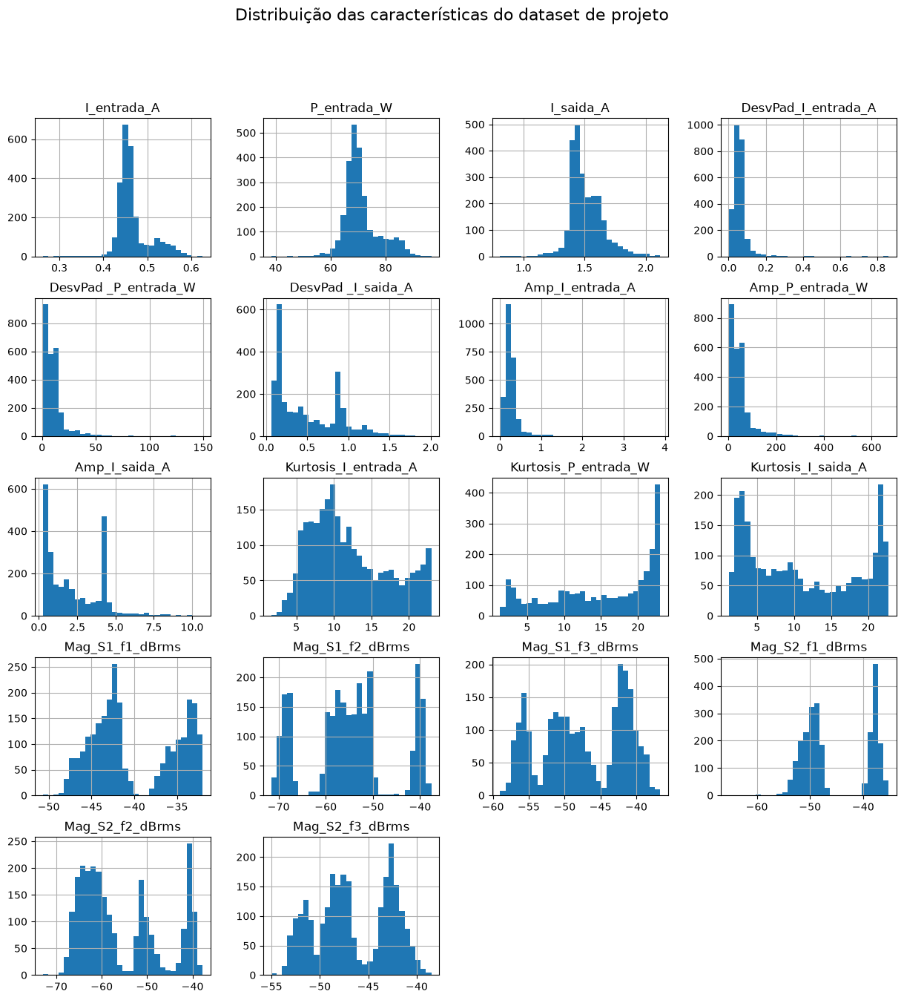

In [30]:
df_maquinas.iloc[:, 2:].hist(figsize=(15, 15), bins = 30)
plt.suptitle('Distribuição das características do dataset de projeto', fontsize=16)
plt.show()

Como parte dessa etapa, também é ideal verificar se todas as casses estão balanceadas, isso é, que todas as classes tenham a mesma quantidade de ocorrências. Para verificar isso, pode-se implementar o seguinte código: 

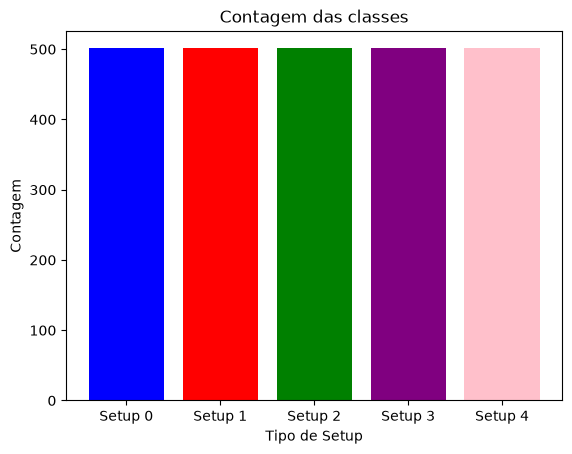

In [31]:
# Contagem das ocorrências de classes

contagem = df_maquinas["tipo_setup"].value_counts()

plt.bar(["Setup 0", "Setup 1", "Setup 2", "Setup 3", "Setup 4"], [contagem[0], contagem[1], contagem[2], contagem[3], contagem[4]], color = ["blue", "red", "green", "purple", "pink"])
plt.title("Contagem das classes")
plt.xlabel("Tipo de Setup")
plt.ylabel("Contagem")
plt.show()

Neste caso, é possível ver que o dataset já possui a quantidade de ocorrências de cada classe balanceada desde o começo, não sendo necessário realizar quaisquer operações nessa frente.

Como a elaboração de um algoritmo de classificação baseia-se nas leituras das relações entre os atributos e a variável alvo, podemos iniciar a visualizar essas relações através tanto de uma matriz de confusão quanto de um gráfico de pares, os quais podem ambos ser visualizados nas células a seguir:

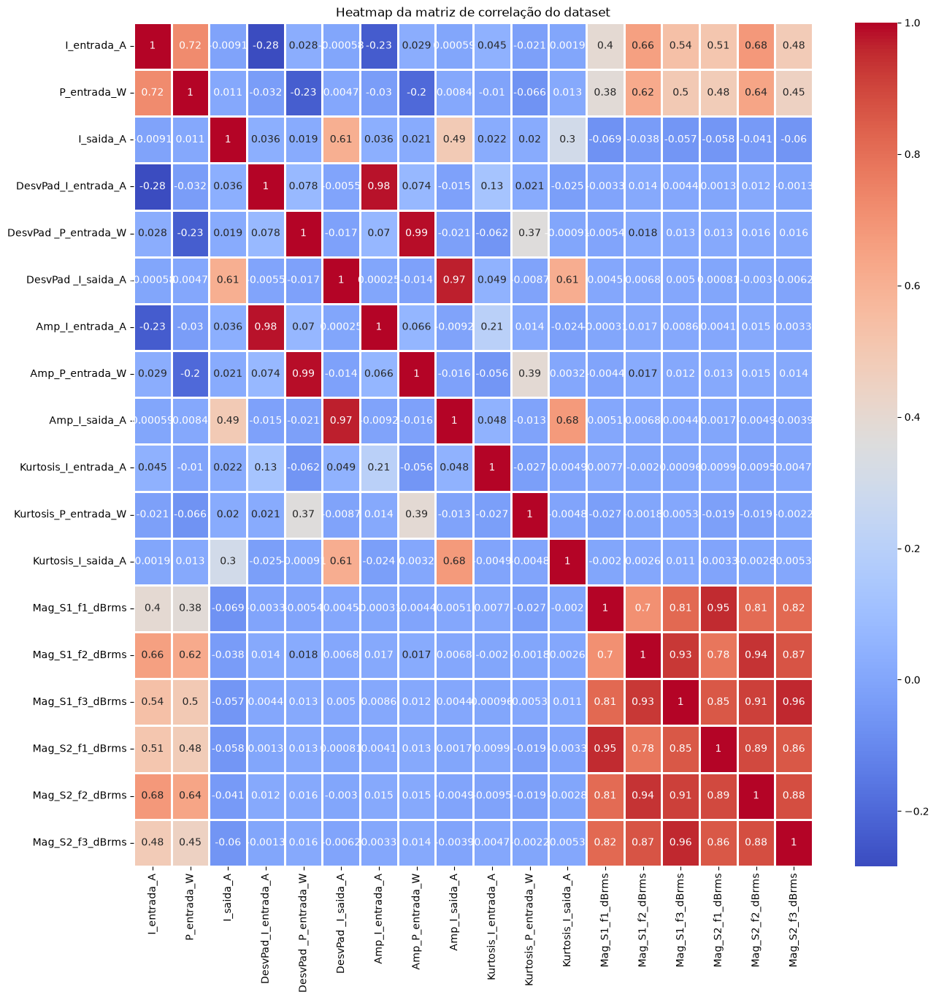

In [35]:
# Elaboração da Matriz de Confusão

correlation_matrix = df_maquinas.iloc[:, 2:].corr()

plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=1)
plt.title('Heatmap da matriz de correlação do dataset')
plt.show()

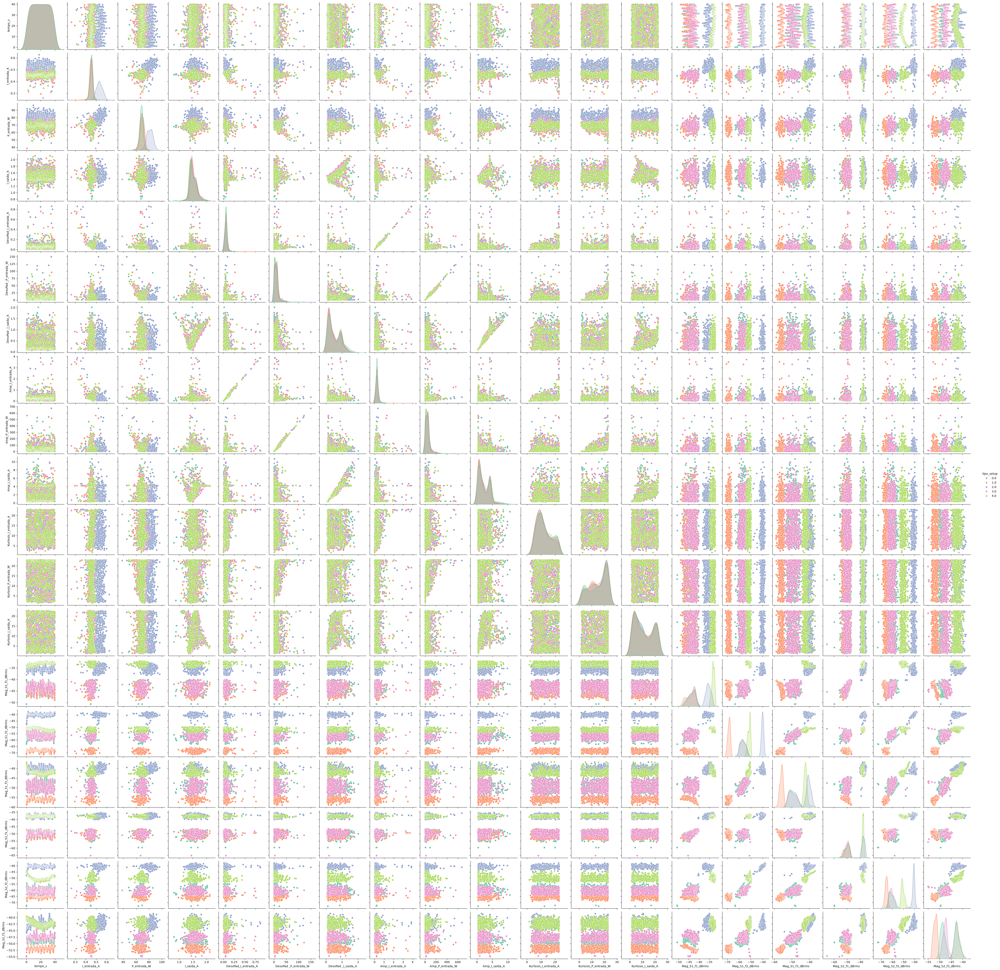

In [36]:
# Elaboração do Gráfico de Pares

sns.pairplot(df_maquinas, hue='tipo_setup', palette='Set2')
plt.show()

#### **3. Pré Processamento dos Dados**

##### **4.1. KNN Classifier**

##### **4.2. Decision Tree**

##### **4.3. SVM**